In [1]:
import torch
torch.cuda.empty_cache() 
from torchvision import transforms

import livia.embedding as embedding
import livia.triplet as triplet
from _7_image_embedding.dataset import ImageDataset

import pandas as pd
import pickle
import os 
from sklearn.decomposition import PCA

if torch.cuda.is_available(): 
    device = "cuda" 
else: 
    device = "cpu"

### Specify the important locations

In [2]:
# specify museum
museum = "mak"
# specify run_name + log_dir + eval_dir + root directory
# root_dir -> where images are stored
root_dir = f'data_local/images/{museum}_cropped'
# log_dir + run_name
log_dir = "models_to_retrain/"
run_name = 'grayscale_wm_pretrained_unfrozen_triplets=249996_size=224_bs=32_margin=1_epochs=60_lr=0.0001_noise=[0.005, 0.0, 0.0]'


In [3]:
# directory where the results are stored
evaluation_dir = f"evaluation_results/{run_name}/{museum}"
# create evaluation dir
if not os.path.isdir("evaluation_results"):
    os.mkdir("evaluation_results")
if not os.path.isdir(f"evaluation_results/{run_name}"):
    os.mkdir(f"evaluation_results/{run_name}")
if not os.path.isdir(evaluation_dir):
    os.mkdir(evaluation_dir)

In [4]:
# load museums data
if museum == "mak":

    mak_1 = pd.read_csv("data_local/mak/mak_1.csv", low_memory=False)
    mak_2 = pd.read_csv("data_local/mak/mak_2.csv", low_memory=False)
    mak_3 = pd.read_csv("data_local/mak/mak_3.csv", low_memory=False)
    museum_data_old = pd.concat([mak_1, mak_2, mak_3])
    museum_data_new = pd.read_csv("data_local/mak/mak.csv")

    cols_to_use = museum_data_new.columns.difference(museum_data_old.columns)
    museum_data = pd.merge(museum_data_old, museum_data_new[list(cols_to_use) + ["priref"]], how='inner', on = 'priref')

    id_column = "priref"
    title_column = "title"
    color_column = "object_name"

    museum_data = museum_data[[id_column, title_column, color_column, "reproduction"]]
    museum_data = museum_data.astype({id_column: "str"})

    #embedding_loaded = embedding.load_csv("data_local/mak/mak_sbert_title_object_name_description_256d.csv")

    def alter_path(img_path):
        img_path = img_path.split("/")[-1]
        img_path = img_path.split(".")[0]
        return img_path

    museum_data["img_path"] = museum_data["reproduction"].apply(alter_path)

In [5]:
size=224
# colored
# transform = transforms.Compose([transforms.CenterCrop(size), transforms.ToTensor(), transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
# grayscale
transform = transforms.Compose([transforms.CenterCrop(size), transforms.Grayscale(num_output_channels=1), transforms.ToTensor()])
eval_dataset = ImageDataset(root_dir=root_dir, transform=transform)
eval_dataloader = torch.utils.data.DataLoader(eval_dataset, batch_size=128, shuffle=False)

In [7]:
import sys
sys.path.insert(0,"./_7_image_embedding")
import _7_image_embedding.utility_functions  as uf

In [8]:
# Evaluate Model
# load model
triplet_model = torch.load(log_dir + run_name + "/triplet_net.pt", map_location=device)
# create image embedding
image_embedding = uf.compute_image_embedding(triplet_model, device, eval_dataloader)
# save image embedding as csv file
embedding.save_to_csv(image_embedding, evaluation_dir + "/image_embedding")

100%|███████████████████████████████████████| 1658/1658 [17:15<00:00,  1.60it/s]


212194
212194


In [9]:
from tqdm import tqdm

In [10]:
priref_list = []
for idx in tqdm(image_embedding.identifier):
    sample = museum_data[museum_data["img_path"]==idx]
    priref = sample["priref"].values[0]
    priref_list.append(priref)

100%|██████████████████████████████████| 212194/212194 [34:49<00:00, 101.55it/s]


In [11]:
len(image_embedding.identifier)

212194

In [12]:
len(priref_list)

212194

In [13]:
image_embedding.embedding.shape

(212194, 128)

In [14]:
import numpy as np


In [15]:
image_embedding_priref = embedding.Embedding(image_embedding.embedding, 
                                      np.array(priref_list, dtype=object))

In [16]:
embedding.save_to_csv(image_embedding_priref, "mak_image_embedding_priref.csv")

In [29]:
meta_data = museum_data.loc[museum_data[id_column].isin(image_embedding_priref.identifier)]
print(meta_data)

       priref                               title object_name  \
0          10                          Bull Spike      Becher   
1         100                          Zeitansage         Uhr   
2       10001                                 NaN      Teller   
3       10002                                 NaN      Teller   
4       10003                                 NaN      Teller   
...       ...                                 ...         ...   
213318  99955       Belutschen-Hali, Hauptteppich     Teppich   
213319  99956                        Knüpfteppich     Teppich   
213320  99959                        Vogel-Uschak         NaN   
213321  99960   Doppelnischen-/ Medaillon-Teppich     Teppich   
213322  99990  Nachahmung des Turiner Leichentuch       Borte   

                                             reproduction      img_path  
0       https://sammlung.mak.at/img/1200x1200/publikat...       ds-10_1  
1       https://sammlung.mak.at/img/1200x1200/publikat...      ds-101_1

In [30]:
n = 5000

In [31]:
# plot image embedding standardized
figure_2 = embedding.plot_3d(image_embedding_priref, meta_data, n, 
               id_column, title_column, color_column, [], 
               f"Image Embedding stand: \n {run_name}", True, window_shape=(2000,750))
figure_2.write_html(evaluation_dir + "/Image_Embedding_stand.html")

# plot image embedding normal
figure_3 = embedding.plot_3d(image_embedding_priref, meta_data, n, 
               id_column, title_column, color_column, [], 
               f"Image Embedding: \n {run_name}", False, window_shape=(2000,750))
figure_3.write_html(evaluation_dir + "/Image_Embedding.html")

In [21]:
n = 200
triplets = triplet.generate_triplets(image_embedding, "clustering", n, nn_k=1, fn_k=5)#, nr_clusters=8, nr_random_sample=10000)
with open(f'{n}_triplets_img_id', 'wb') as fp:
    pickle.dump(triplets, fp)

200 triplets are generated. This may take a while ... 
0 triplets have been removed to preserve uniqueness
200 triplets are returned


('ki-12784-27_1.224.jpg', 'ki-11961-1_1.224.jpg', 'ki-18709-180-4_1.224.jpg')


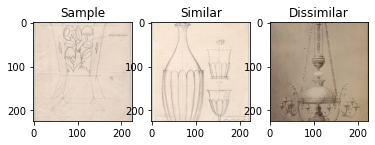

('ki-431_1.224.jpg', 'ki-7421-4_1.224.jpg', 'go-2265-13_1.224.jpg')


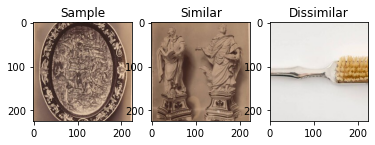

('pi-3109_1.224.jpg', 'ke-8740_1.224.jpg', 'bi-14872-1415_1.224.jpg')


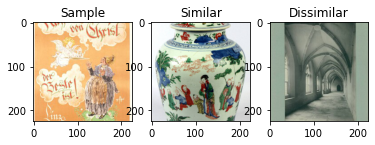

('ki-11545-2_1.224.jpg', 'ki-9576-4_1.224.jpg', 'ki-6396-2-56-8_1.224.jpg')


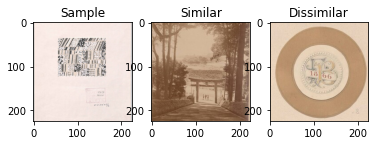

('ki-12724-8_1.224.jpg', 'khm-272-3_1.224.jpg', 'ki-9005-9-4_1.224.jpg')


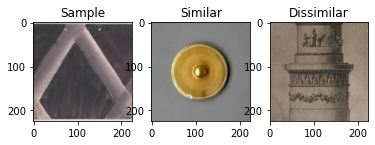

('ki-14145-907-158_10.224.jpg', 'tgm-20163_1.224.jpg', 'ke-6357-2_1.224.jpg')


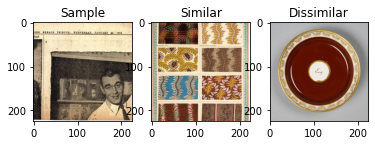

('haf-1240_1.224.jpg', 'pz-3182_1.224.jpg', 'ki-16467-8_1.224.jpg')


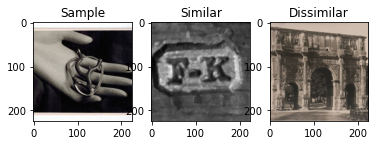

('gl-1578_1.224.jpg', 'br-1420_1.224.jpg', 'ki-10461-46_1.224.jpg')


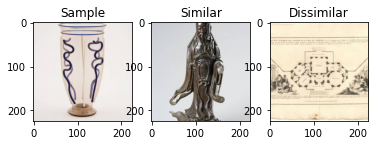

('t-10705_1.224.jpg', 'ki-7624-4_1.224.jpg', 'ki-1-954-16_1.224.jpg')


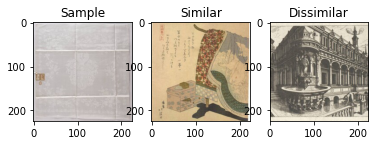

('ki-1409-61_1.224.jpg', 'ki-13621_1.224.jpg', 'li-10183_1.224.jpg')


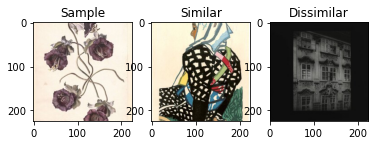

('wwf-95-168-7_1.224.jpg', 'ki-1911-39_1.224.jpg', 'ki-15765-2310_1.224.jpg')


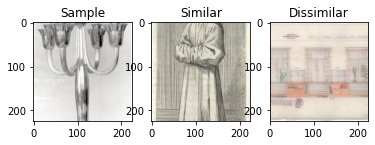

('ki-1-829-5_1.224.jpg', 'br-238_1.224.jpg', 'ki-1-658-118_1.224.jpg')


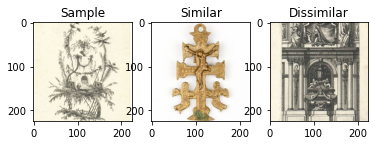

('ki-771-380_1.224.jpg', 'bi-1160-89-3_1.224.jpg', 'pi-4037_1.224.jpg')


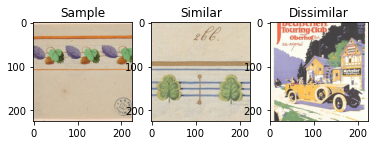

('wwgg-731-4_1.224.jpg', 'ki-12305-14_1.224.jpg', 'ke-9782_1.224.jpg')


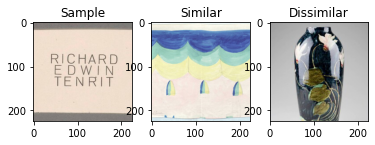

('pz-4033_1.224.jpg', 'lni-1765_1.224.jpg', 'ki-9004-10-2_1.224.jpg')


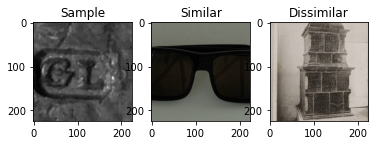

('t-3302-47_1.224.jpg', 't-11314-1_1.224.jpg', 'ki-5947-28_1.224.jpg')


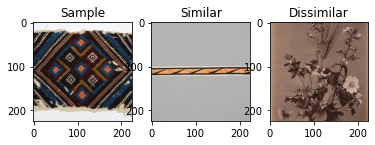

('bi-12381-2-1-22_1.224.jpg', 'hm-13913_1.224.jpg', 'wws-350_1.224.jpg')


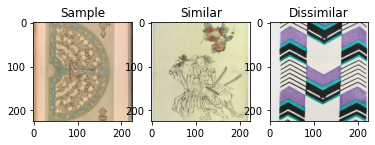

('t-14008-3_1.224.jpg', 'wi-867_1.224.jpg', 'ki-18709-86-2_1.224.jpg')


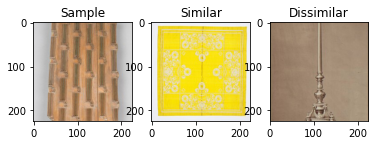

('wwf-115-11-3_1.224.jpg', 'ki-4105-18_1.224.jpg', 'ke-7451-2_1.224.jpg')


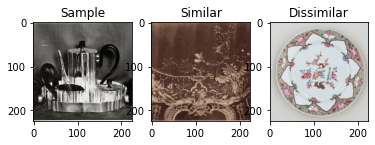

('ki-14145-914-48_1.224.jpg', 'ki-14145-894-182_1.224.jpg', 'ki-6396-1-93-3_1.224.jpg')


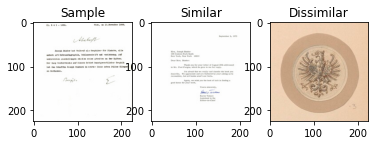

('ki-6755_1.224.jpg', 'ki-12041-2_1.224.jpg', 'bi-14872-1061_1.224.jpg')


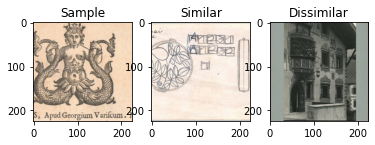

('ki-16714-31_1.224.jpg', 'ki-7931-5_1.224.jpg', 'ki-14274-495-6_1.224.jpg')


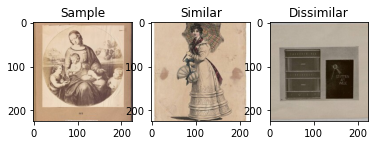

('ki-898_1.224.jpg', 'ki-23287-33_1.224.jpg', 'pi-1896_1.224.jpg')


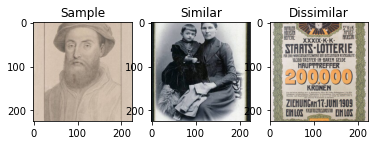

('ki-12883-4_1.224.jpg', 'ki-23261-27_1.224.jpg', 'ki-15929-16_1.224.jpg')


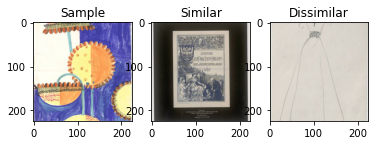

('ki-14142-2-191_1.224.jpg', 'go-1731_1.224.jpg', 'ki-8011-112_1.224.jpg')


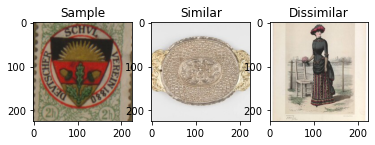

('em-3-4_1.224.jpg', 'ki-8971-1264_1.224.jpg', 'ki-11967-6_1.224.jpg')


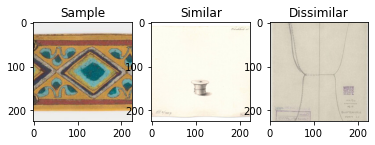

('gl-2950_1.224.jpg', 'ke-11731_1.224.jpg', 'ki-12349-38_1.224.jpg')


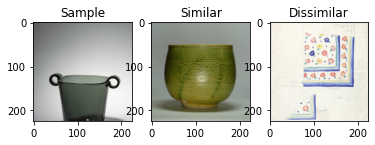

('ki-3149-3_1.224.jpg', 'ki-12706-21_1.224.jpg', 'ki-8675-49_1.224.jpg')


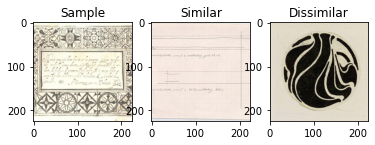

('gl-1938_1.224.jpg', 'wwf-98-85-3_1.224.jpg', 'ki-10083-14_1.224.jpg')


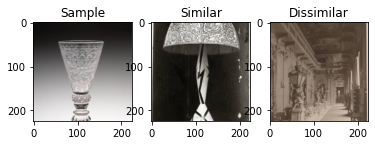

('pz-7126_1.224.jpg', 'pz-7136_1.224.jpg', 'bi-17427-45_1.224.jpg')


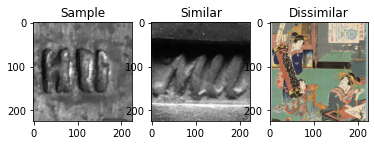

('ki-23099-168_1.224.jpg', 'wwgg-608-4_1.224.jpg', 'ki-10344-9_1.224.jpg')


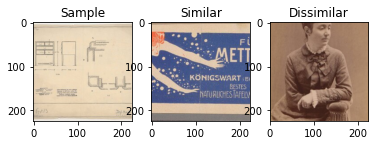

('ki-10316-640_1.224.jpg', 'ki-4725-10_1.224.jpg', 'pz-2441_1.224.jpg')


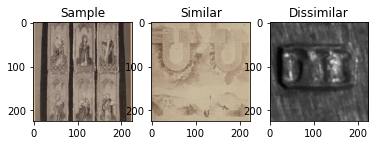

('ki-11935-23_1.224.jpg', 'ki-10316-490_1.224.jpg', 'ki-1586_1.224.jpg')


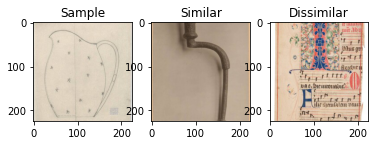

('ki-15165-816-4_1.224.jpg', 'ki-15165-28-2_1.224.jpg', 'ki-4770_1.224.jpg')


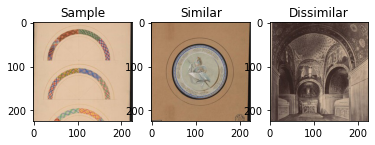

('ki-8971-219_1.224.jpg', 'ki-16848-23-2_1.224.jpg', 'ki-15934-28_1.224.jpg')


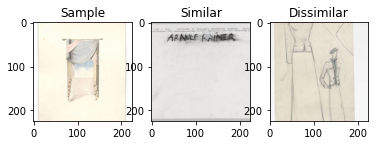

('pi-1137_1.224.jpg', 'pz-1104_1.224.jpg', 'ki-7639-22_1.224.jpg')


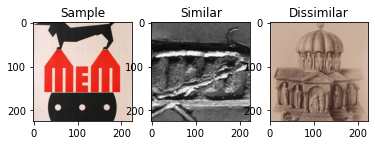

('ki-7717-493_1.224.jpg', 'wwf-97-7-8_1.224.jpg', 'ki-1862-6_1.224.jpg')


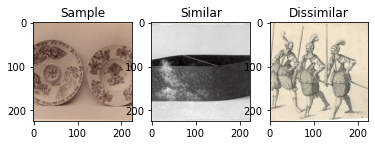

('wwf-91-17-3_1.224.jpg', 'or-3925-161_1.224.jpg', 'ki-12680-36_1.224.jpg')


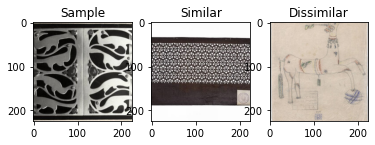

('wwad-221-1_1.224.jpg', 'ki-12048-10_1.224.jpg', 'li-9223_1.224.jpg')


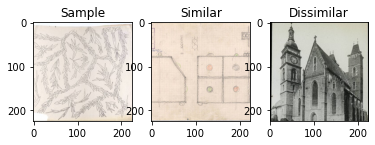

('bi-13216-2_1.224.jpg', 'wwf-114-5-7_1.224.jpg', 'or-3925-2887_1.224.jpg')


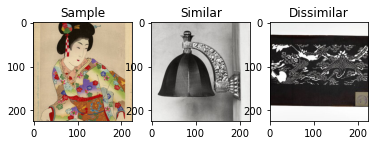

('go-1722_1.224.jpg', 'go-21_1.224.jpg', 'ki-14291-287_1.224.jpg')


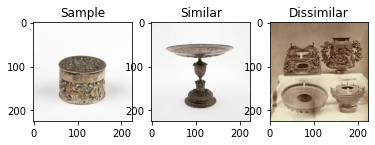

('ki-8700-4_1.224.jpg', 'ki-1-625-3_1.224.jpg', 'wwmo-179-572_1.224.jpg')


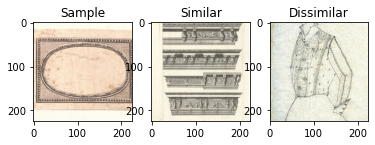

('ki-3949-131_1.224.jpg', 'pl-594_1.224.jpg', 'ki-9005-9-4_1.224.jpg')


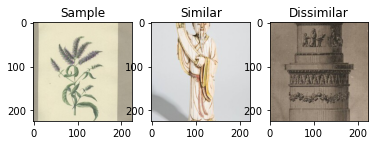

('ki-1-977-1_1.224.jpg', 'ki-1-892-3_1.224.jpg', 'ki-3949-382_1.224.jpg')


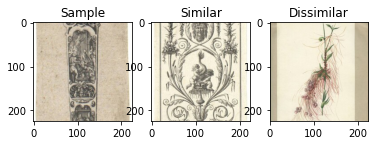

('ki-3701-2_1.224.jpg', 'tgm-29566-2_1.224.jpg', 'ds-201-2_1.224.jpg')


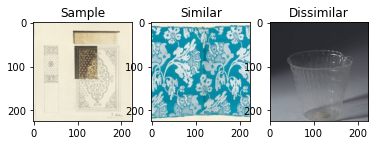

('ki-15765-2389_1.224.jpg', 'li-10819-2_1.224.jpg', 'pz-6854_1.224.jpg')


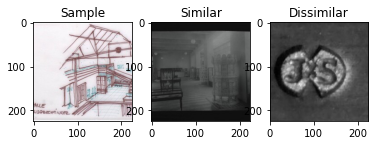

('ki-8971-1408_1.224.jpg', 'ki-12163-54_1.224.jpg', 'ki-3949-166_1.224.jpg')


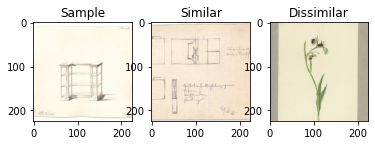

('wwf-109-63a-1_1.224.jpg', 'ki-1-546-5_1.224.jpg', 'me-213_1.224.jpg')


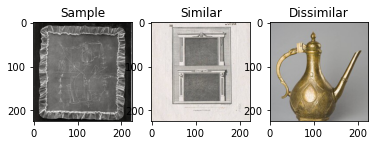

('ke-6600_3.224.jpg', 'wi-1476-6_1.224.jpg', 'ki-3053-18_1.224.jpg')


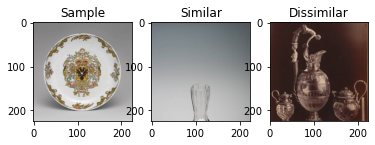

('pi-15574_1.224.jpg', 'wwmo-177-212_1.224.jpg', 'ki-14182-102_1.224.jpg')


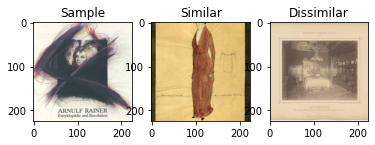

('ki-12268-2_1.224.jpg', 'li-9143_1.224.jpg', 'wwf-91-13-5_1.224.jpg')


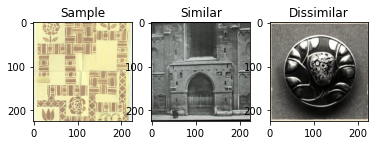

('ki-12284-16_1.224.jpg', 'pi-2755_1.224.jpg', 'ki-16752-18_1.224.jpg')


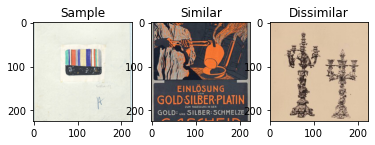

('ki-12788-4-2_1.224.jpg', 'ki-12004-4_1.224.jpg', 'soke-241_1.224.jpg')


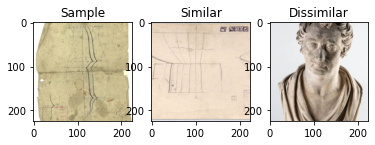

('ki-8595-33_1.224.jpg', 'wwf-109-37-2_1.224.jpg', 'or-1020_1.224.jpg')


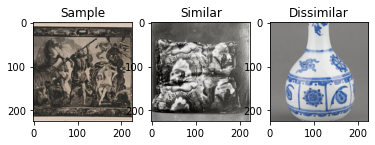

('ki-2373-7_1.224.jpg', 'ki-10556-3_1.224.jpg', 'ki-14633-6_1.224.jpg')


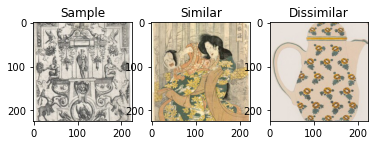

('ki-15336-5_1.224.jpg', 'ki-15292_1.224.jpg', 'wwbp-210-11_1.224.jpg')


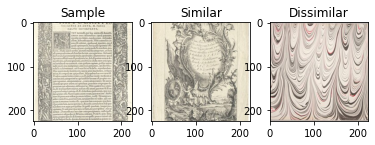

('ki-12331-34_1.224.jpg', 'ke-3111-2_1.224.jpg', 'ki-16908-14_1.224.jpg')


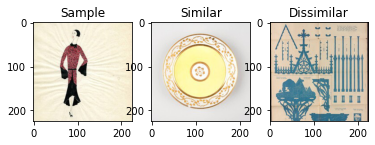

('h-780-2_1.224.jpg', 'bi-12966-192_1.224.jpg', 'ki-12086-47_1.224.jpg')


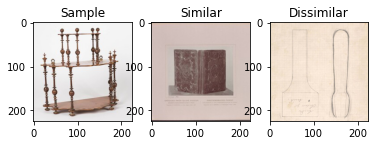

('hm-13267_1.224.jpg', 'ki-13214-13_1.224.jpg', 'ki-4424_1.224.jpg')


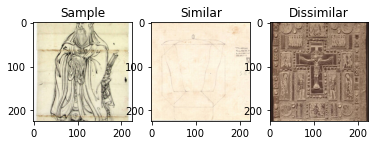

('ki-3640-22_1.224.jpg', 'ki-7989-278_1.224.jpg', 't-3302-549_1.224.jpg')


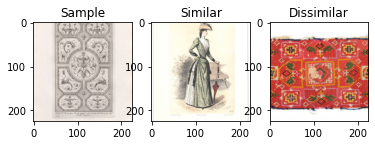

('br-1090_1.224.jpg', 'wi-1699_1.224.jpg', 'ki-9378-3-4_1.224.jpg')


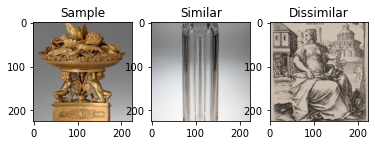

('bi-14872-24_1.224.jpg', 't-10012_1.224.jpg', 'ki-236-2-5_1.224.jpg')


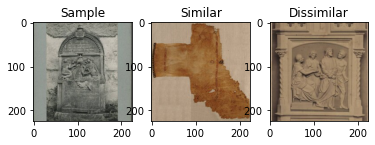

('pz-5752_1.224.jpg', 'pz-4651_1.224.jpg', 'ki-4848_1.224.jpg')


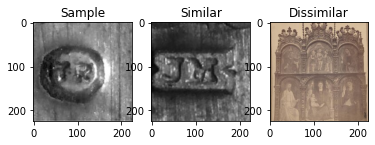

('ki-19781_1.224.jpg', 'wwf-114-6-3_1.224.jpg', 'ki-2903-58_1.224.jpg')


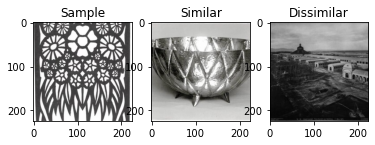

('wwfp-79_1.224.jpg', 'ki-14393-14_1.224.jpg', 'ki-8161-20_1.224.jpg')


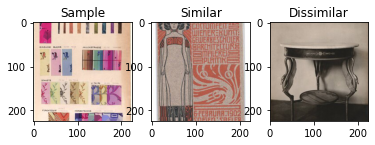

('ki-14940_1.224.jpg', 'ke-6201-157-15_1.224.jpg', 'ki-9141-2_1.224.jpg')


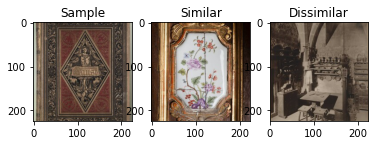

('ki-771-686_1.224.jpg', 't-13793_1.224.jpg', 'ke-8274_1.224.jpg')


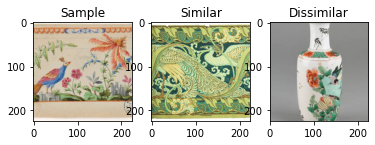

('ki-1926_1.224.jpg', 'ki-1988-9_1.224.jpg', 'soke-222-8_1.224.jpg')


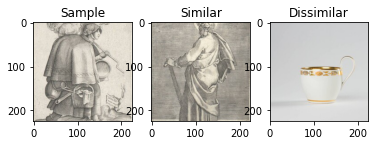

('gl-1735-1_2.224.jpg', 'ki-14145-914-22_1.224.jpg', 'ki-8213_1.224.jpg')


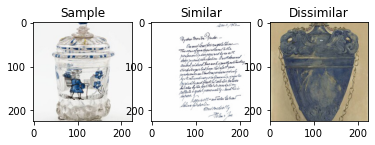

('ki-13660-29-1_1.224.jpg', 'ki-2143-16_1.224.jpg', 'ki-12679-8_1.224.jpg')


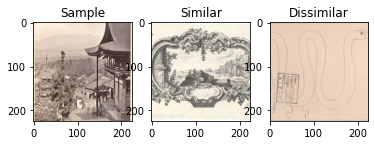

('ki-1-658-132_1.224.jpg', 'ki-8025-25_1.224.jpg', 'or-3925-3671_1.224.jpg')


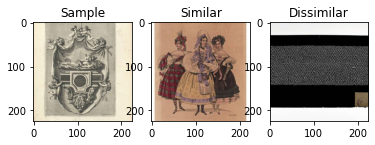

('ki-12331-23_1.224.jpg', 'pl-979-5_1.224.jpg', 'ki-1094-23_1.224.jpg')


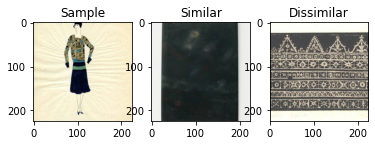

('ki-14145-907-170_1.224.jpg', 'ki-15765-3055_1.224.jpg', 'ki-486-3_1.224.jpg')


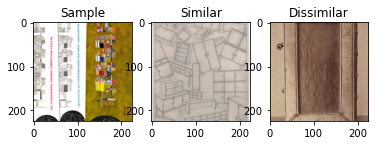

('ki-14145-907-72_26.224.jpg', 'ki-2574-16_1.224.jpg', 'ki-6661-4_1.224.jpg')


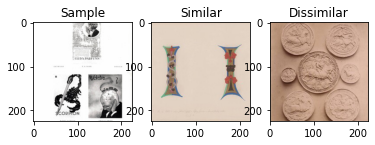

('ki-976-15_1.224.jpg', 'ki-9359-1-2_1.224.jpg', 'ki-9080-43_1.224.jpg')


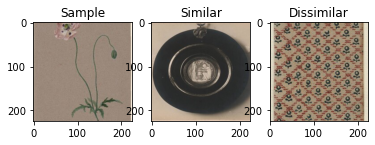

('pz-1176_1.224.jpg', 'lni-903_1.224.jpg', 'ki-4979-3_1.224.jpg')


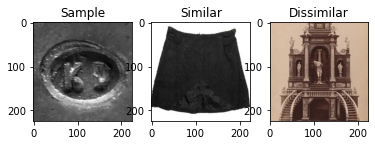

('bi-12219-11-77_1.224.jpg', 'hm-14505_1.224.jpg', 'haf-523_1.224.jpg')


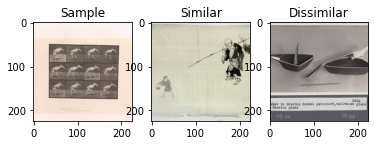

('ki-15890-1-1_1.224.jpg', 'ki-14274-346_1.224.jpg', 'ki-11939-17_1.224.jpg')


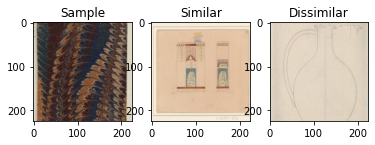

('ki-12696-31_1.224.jpg', 'ki-1-658-152_1.224.jpg', 'ke-4902-1_1.224.jpg')


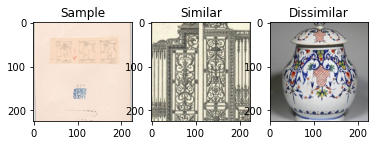

('ki-7425-103_1.224.jpg', 'ki-11092_1.224.jpg', 'tgm-21516_1.224.jpg')


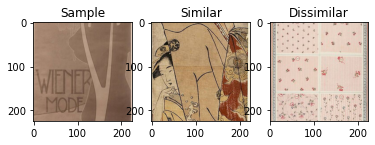

('ki-16043-1_1.224.jpg', 'ki-859-4_1.224.jpg', 'ki-1-1103-6_1.224.jpg')


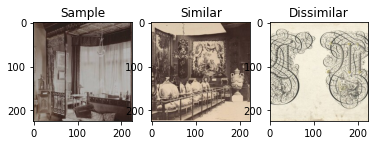

('ki-4167_1.224.jpg', 'ki-5702-7_1.224.jpg', 'ki-11967-12_1.224.jpg')


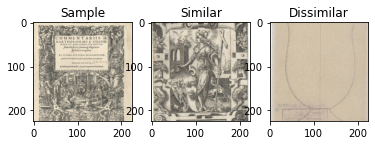

('ki-6396-2-68-7_1.224.jpg', 'ki-6396-3-38-2_1.224.jpg', 'li-1069-1_1.224.jpg')


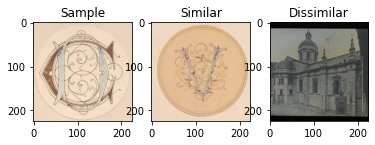

('ki-10461-41_1.224.jpg', 'li-1050_1.224.jpg', 'br-950-11_1.224.jpg')


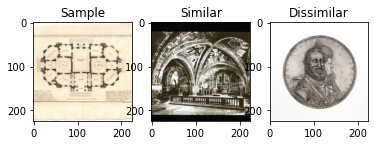

('go-1614_1.224.jpg', 'ki-10774_1.224.jpg', 'bi-13977-547_1.224.jpg')


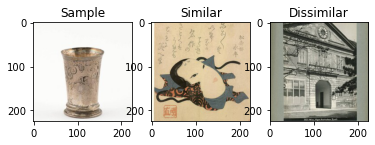

('wwe-174-2_1.224.jpg', 'wwf-106-13-2_1.224.jpg', 'li-1337_1.224.jpg')


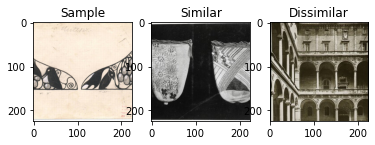

('ki-286-4_1.224.jpg', 'ki-3033-45_1.224.jpg', 'go-2134_5.224.jpg')


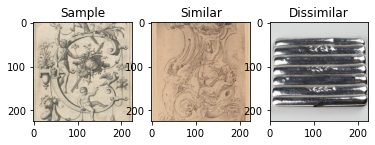

('wwf-172-293_1.224.jpg', 'go-1990-55_3.224.jpg', 'ki-12656-11_1.224.jpg')


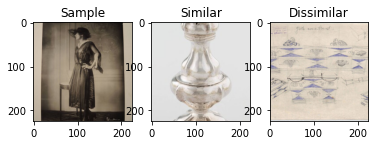

('ki-11933-24_1.224.jpg', 'or-3925-2674_1.224.jpg', 'pl-852_1.224.jpg')


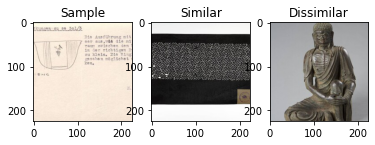

('ki-11934-15_1.224.jpg', 'ki-4180-1_1.224.jpg', 'ki-16527-25_1.224.jpg')


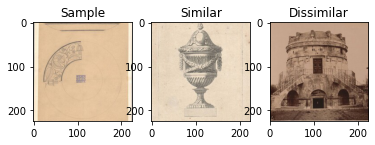

('h-2799_1.224.jpg', 'ki-18709-84-2_1.224.jpg', 'ki-23257-1_1.224.jpg')


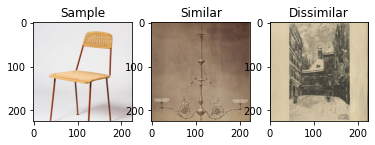

('tgm-21429_1.224.jpg', 'bi-1162-39-2_1.224.jpg', 'ki-11966-32_1.224.jpg')


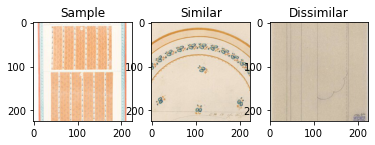

('ke-4666-2_1.224.jpg', 'ki-9121-31_1.224.jpg', 'ki-509-2_1.224.jpg')


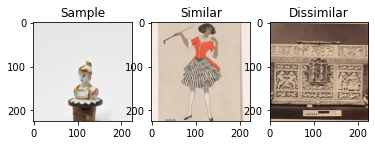

('ki-12167-20_1.224.jpg', 'ki-14060-2-7_1.224.jpg', 'li-9163_1.224.jpg')


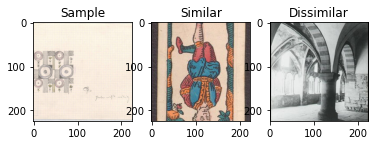

('ki-4975-3_1.224.jpg', 'ki-1411-3_1.224.jpg', 'go-2157_1.224.jpg')


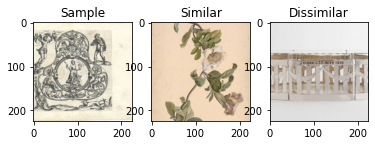

('pz-1662_1.224.jpg', 'pz-1019_1.224.jpg', 'ki-3931-30_1.224.jpg')


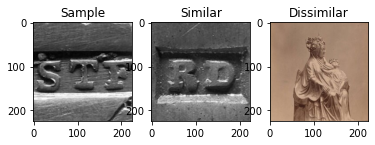

('t-246_1.224.jpg', 'ki-12293-12_1.224.jpg', 'go-1797_1.224.jpg')


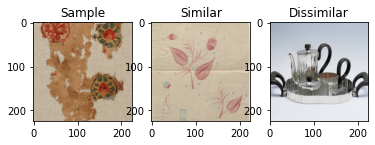

('wwgg-628-2_1.224.jpg', 'bi-1161-8_1.224.jpg', 'ki-3949-466_1.224.jpg')


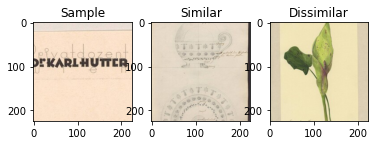

('ki-13660-14-4_1.224.jpg', 'ki-7710-154_1.224.jpg', 'ki-11279-180_1.224.jpg')


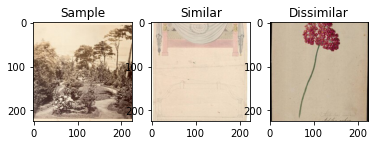

('h-2863-2_1.224.jpg', 'ki-15165-802-10_1.224.jpg', 'ki-4457-1_1.224.jpg')


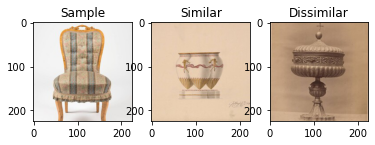

('pi-9684_1.224.jpg', 'ki-4073-52_1.224.jpg', 'ke-11569_1.224.jpg')


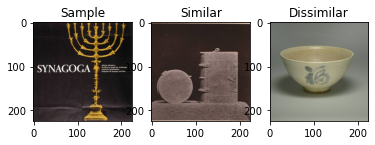

('gk-372_1.224.jpg', 'ki-1-729-25_1.224.jpg', 'ki-7507-12-2_1.224.jpg')


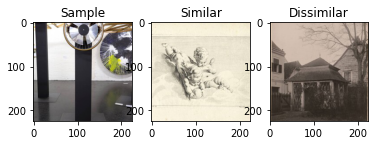

('ki-14145-1240-1_3.224.jpg', 'gl-917_1.224.jpg', 'ki-10316-414-1_1.224.jpg')


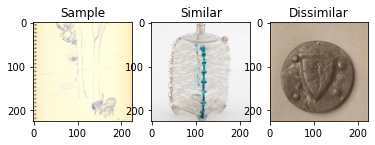

('ki-14145-907-4_2.224.jpg', 't-8724-6_1.224.jpg', 'wi-1093_1.224.jpg')


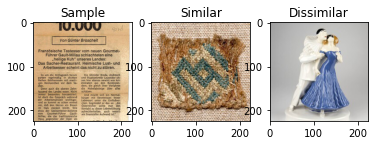

('ki-3978-126-1_1.224.jpg', 'ki-8635-58_1.224.jpg', 'ki-7549-9_1.224.jpg')


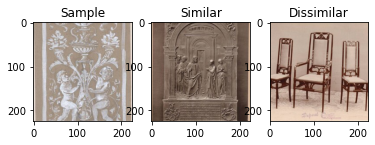

('ke-10339-116_1.224.jpg', 'ke-7451-2_1.224.jpg', 'bi-12381-2-1-40_1.224.jpg')


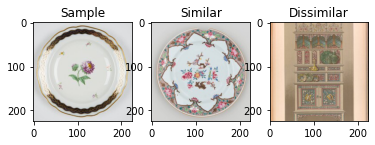

('wwf-105-4-2_1.224.jpg', 'pi-2058_1.224.jpg', 'wwf-90-71-5_1.224.jpg')


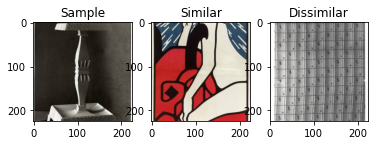

('ki-7348-2_1.224.jpg', 'ki-14145-881-18_17.224.jpg', 'ki-4148-48_1.224.jpg')


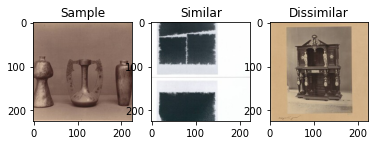

('ke-10160_1.224.jpg', 'gl-3610_1.224.jpg', 'ki-7824-15_1.224.jpg')


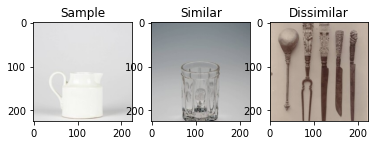

('ki-19528-6-1_1.224.jpg', 'pl-802_1.224.jpg', 'ki-10953-49_1.224.jpg')


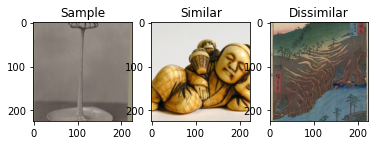

('or-3925-7969_1.224.jpg', 'or-3925-4763_1.224.jpg', 'ki-16617-10_1.224.jpg')


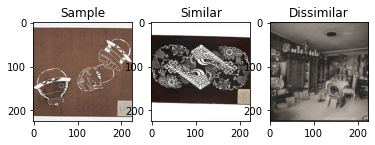

('t-3851-23_1.224.jpg', 'tgm-2-2390_1.224.jpg', 'ki-7670-6_1.224.jpg')


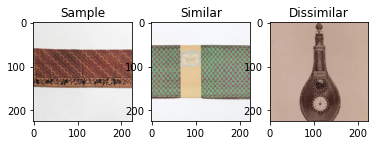

('ki-23336-116_1.224.jpg', 'bi-1179-2_1.224.jpg', 'pz-5651_1.224.jpg')


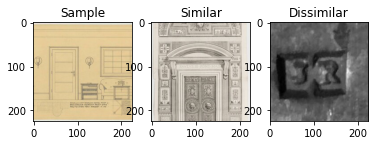

('ki-7931-43_1.224.jpg', 'wwe-244-2_1.224.jpg', 'tgm-21374_1.224.jpg')


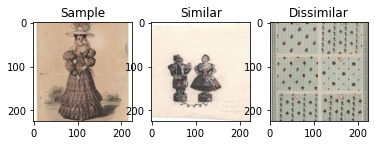

('ki-13329-1_1.224.jpg', 'or-3925-2156_1.224.jpg', 'wws-832_1.224.jpg')


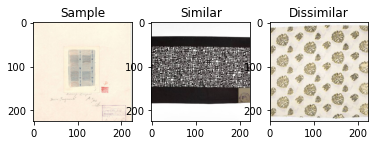

('tgm-24250_1.224.jpg', 'ki-12154-27_1.224.jpg', 'pi-13511_1.224.jpg')


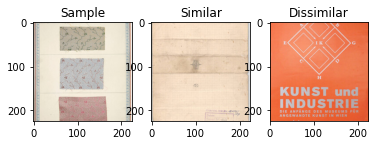

('f-714_1.224.jpg', 't-7390-9-9_1.224.jpg', 'hm-13849_1.224.jpg')


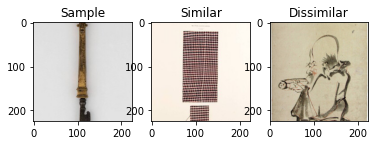

('go-686_1.224.jpg', 'or-3925-2537_1.224.jpg', 'pl-115_1.224.jpg')


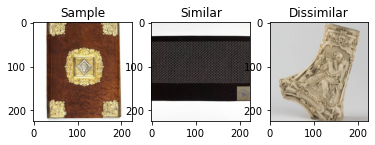

('go-702_1.224.jpg', 'tgm-21202_1.224.jpg', 'ki-8113-21_1.224.jpg')


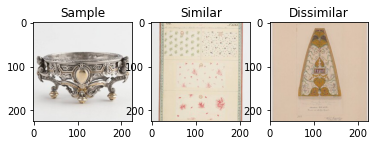

('ki-7593-8_1.224.jpg', 'ki-23287-35_1.224.jpg', 'haf-782_1.224.jpg')


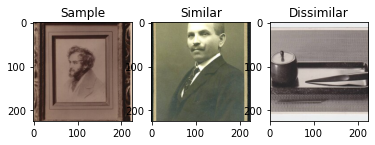

('ki-4816-2_1.224.jpg', 'ki-7610-1_1.224.jpg', 'go-2005-1_1.224.jpg')


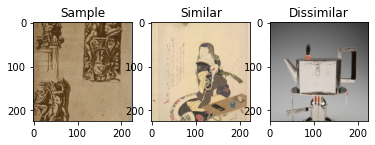

('khm-17_1.224.jpg', 'ki-12758-3_1.224.jpg', 'bi-14872-1287_1.224.jpg')


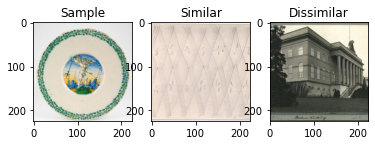

('ke-10103_1.224.jpg', 'pz-3367_1.224.jpg', 'ki-8633-9_1.224.jpg')


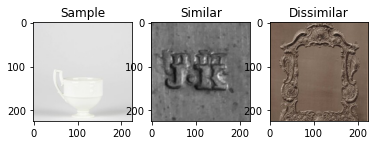

('lni-334-1-2_1.224.jpg', 'lni-47_1.224.jpg', 'ki-14182-8_1.224.jpg')


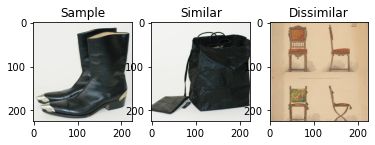

('ke-7090_2.224.jpg', 'ki-14730-21_1.224.jpg', 'ki-23255-20-4_1.224.jpg')


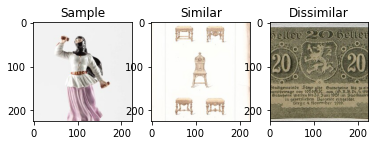

('ki-23072-4-1_1.224.jpg', 'li-18221_1.224.jpg', 'ke-11878_3.224.jpg')


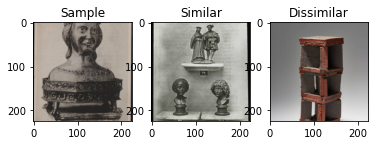

('ki-13188-3_1.224.jpg', 'ki-11781-3_1.224.jpg', 'ki-14145-106-2_1.224.jpg')


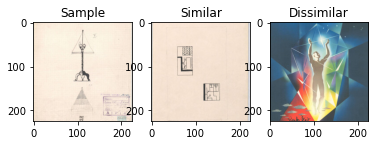

('ki-7269-22_1.224.jpg', 'ki-8014-9_1.224.jpg', 'ki-12063-17-1_1.224.jpg')


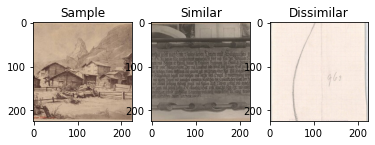

('ki-1-184-1_1.224.jpg', 'ki-2677_1.224.jpg', 'haf-1344_1.224.jpg')


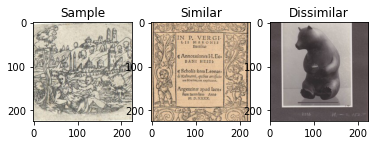

('pz-6134_1.224.jpg', 'pz-3573_1.224.jpg', 'wwpke-197-1_1.224.jpg')


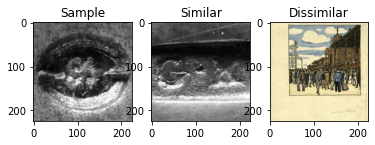

('ki-13758-81_1.224.jpg', 'haf-693_1.224.jpg', 'ki-12039-21_1.224.jpg')


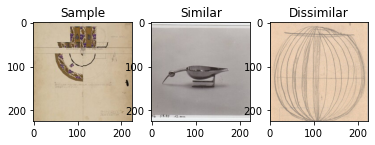

('pi-3842_1.224.jpg', 'ki-10461-5_1.224.jpg', 'ki-7930-16-1_1.224.jpg')


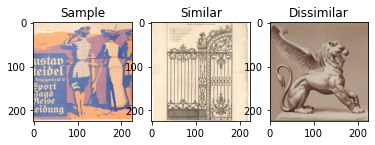

('ki-13254-51_1.224.jpg', 'ki-12129-27_1.224.jpg', 'ke-513_1.224.jpg')


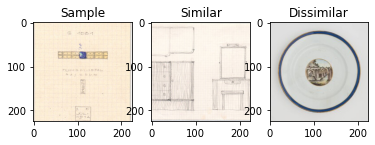

('wwf-107-5-10_1.224.jpg', 'ki-14145-1205_1.224.jpg', 'ki-6896-68_1.224.jpg')


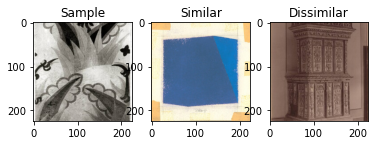

('ki-12315-2_1.224.jpg', 'ki-5692-12_1.224.jpg', 't-7390-12-14_1.224.jpg')


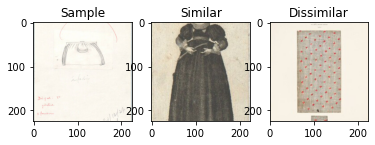

('or-3925-4314_1.224.jpg', 'or-3925-88_1.224.jpg', 'ki-8660-6_1.224.jpg')


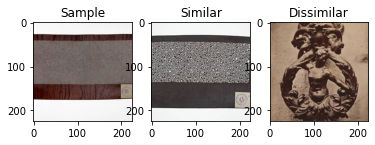

('ki-15951-31_1.224.jpg', 'wi-1515_1.224.jpg', 'ki-3154-5_1.224.jpg')


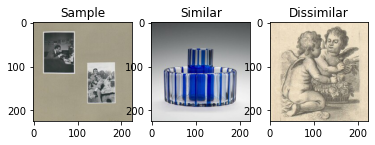

('pz-5673_1.224.jpg', 'wwf-96-218-3_1.224.jpg', 'ki-7339-27_1.224.jpg')


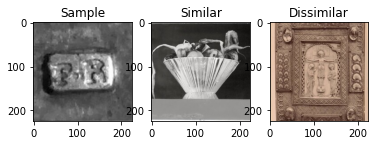

('ki-7696-33_1.224.jpg', 'ki-5769-111_1.224.jpg', 'haf-1052_1.224.jpg')


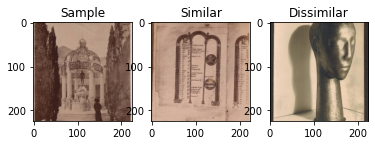

('ki-12663-22_1.224.jpg', 'ki-1717_1.224.jpg', 't-10874-3_1.224.jpg')


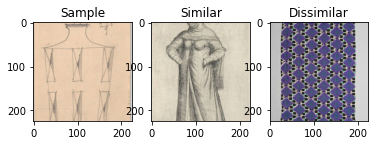

('ki-15934-88_1.224.jpg', 'ki-8875-76_1.224.jpg', 'wwpla-9_1.224.jpg')


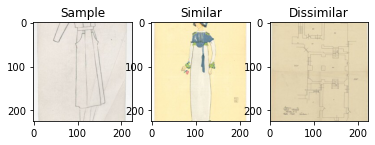

('mal-226-1_1.224.jpg', 'ds-369_1.224.jpg', 'bi-12381-2-1-78_1.224.jpg')


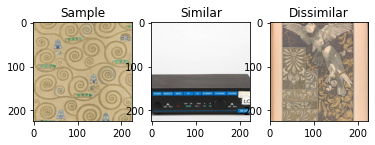

('or-427_11.224.jpg', 'ki-7710-120_1.224.jpg', 'ki-15929-17_1.224.jpg')


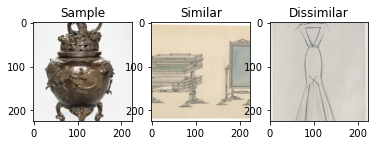

('or-3925-2267_1.224.jpg', 'ki-8396-16_1.224.jpg', 'li-1521_1.224.jpg')


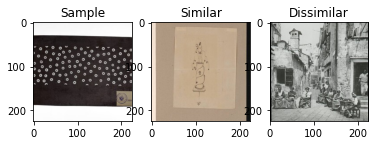

('bi-14872-1341_1.224.jpg', 'ki-15245-6_1.224.jpg', 'pi-6864_1.224.jpg')


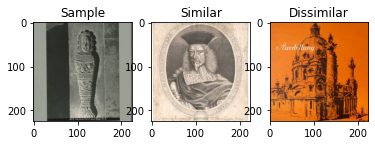

('tgm-29975_1.224.jpg', 'ki-6562-57_1.224.jpg', 'ki-7356-17_1.224.jpg')


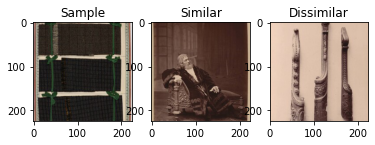

('ki-12419_1.224.jpg', 'ki-12898-2_1.224.jpg', 'wwv-78_1.224.jpg')


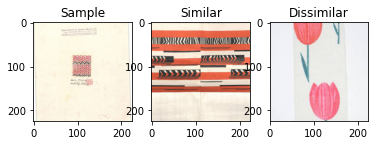

('wwf-107-42-2_1.224.jpg', 'ki-2903-18_1.224.jpg', 'ki-12786-9_1.224.jpg')


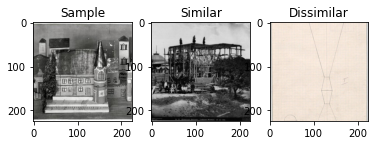

('pi-2862_1.224.jpg', 't-11409-17_1.224.jpg', 'ki-8025-157_1.224.jpg')


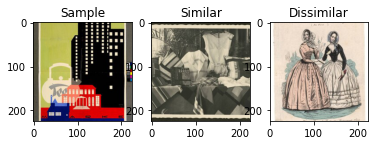

('ki-8015-62_1.224.jpg', 'ki-7571-61_1.224.jpg', 'h-973_1.224.jpg')


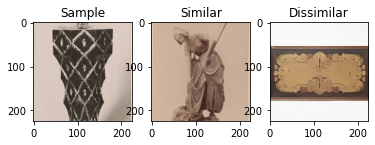

('or-3925-2923_1.224.jpg', 'or-3925-427_1.224.jpg', 'ki-12039-49_1.224.jpg')


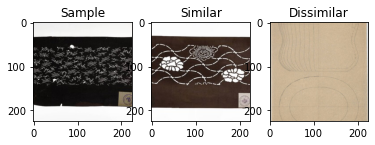

('ki-13660-20-2_1.224.jpg', 'ki-11858-1_1.224.jpg', 'hm-12179_1.224.jpg')


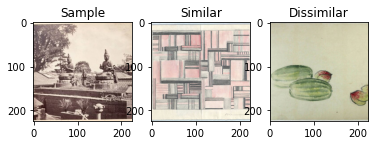

('ki-12155-35_1.224.jpg', 'wwsp-1657_1.224.jpg', 'tgm-21662_1.224.jpg')


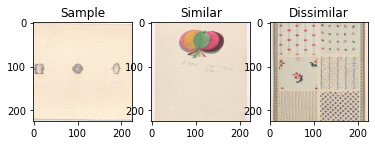

('ki-13330-3_1.224.jpg', 'ki-12789-32_1.224.jpg', 'pi-2662_1.224.jpg')


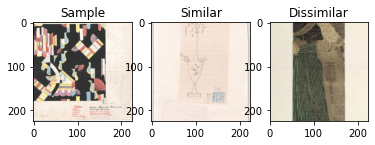

('pi-14565_1.224.jpg', 'ke-6201-102-1_1.224.jpg', 'wwf-137-57-2_1.224.jpg')


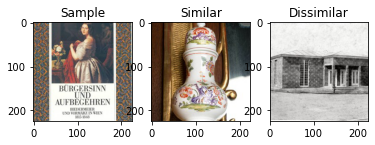

('ki-2715-23_1.224.jpg', 'ki-7341-119_1.224.jpg', 'go-1191_1.224.jpg')


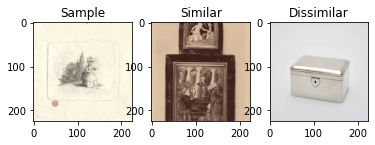

('ki-14145-919-29_1.224.jpg', 'ke-10870_1.224.jpg', 'li-10439_1.224.jpg')


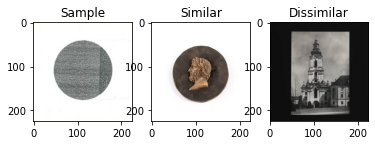

('tgm-22538_1.224.jpg', 'ki-13257-6_1.224.jpg', 'ke-9577_1.224.jpg')


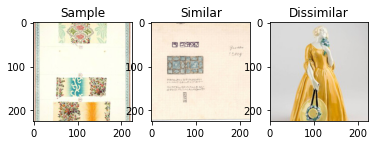

('ki-1-893-2_1.224.jpg', 'tgm-20440_1.224.jpg', 'ki-9486-1-2_1.224.jpg')


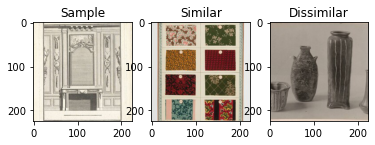

('ki-14145-907-5-322_1.224.jpg', 'pz-4303_1.224.jpg', 'wwsm-14_1.224.jpg')


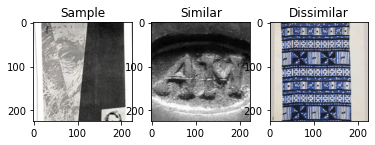

('ki-1413-3-1_1.224.jpg', 'ki-8971-2054_1.224.jpg', 'ki-11967-30_1.224.jpg')


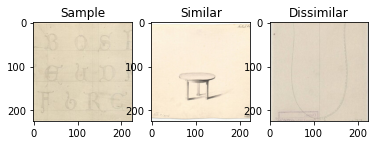

('ke-6201-31-3_1.224.jpg', 'ki-15244-9_1.224.jpg', 'ki-7507-12-1_1.224.jpg')


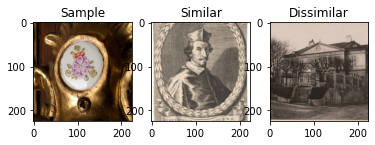

('pz-577_1.224.jpg', 'pz-613_1.224.jpg', 'ki-7139-55_1.224.jpg')


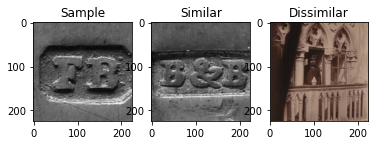

('wwsp-1678_1.224.jpg', 'ki-12568-3_1.224.jpg', 'li-1137_1.224.jpg')


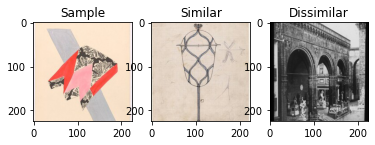

('ki-23336-81_1.224.jpg', 'ki-16651-1_1.224.jpg', 'gl-2423_1.224.jpg')


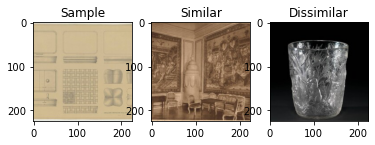

('ki-14145-919-24_2.224.jpg', 'me-1305_1.224.jpg', 'ki-7777-1_1.224.jpg')


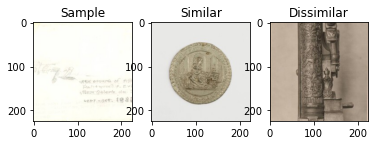

('ki-2448-1_1.224.jpg', 't-361_1.224.jpg', 'gl-3281_1.224.jpg')


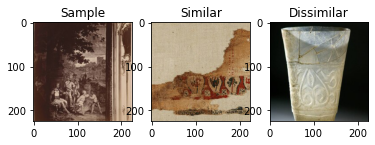

('or-1297_2.224.jpg', 'pz-7386_1.224.jpg', 'ki-7847-3_1.224.jpg')


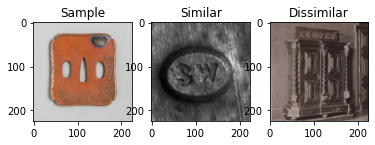

('ki-3094-3_1.224.jpg', 'ke-6201-124-62_1.224.jpg', 'bi-12219-6-34_1.224.jpg')


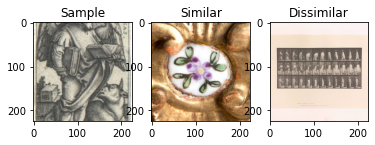

('ki-14145-907-4_12.224.jpg', 'ki-7256-8_1.224.jpg', 'ki-11297-31_1.224.jpg')


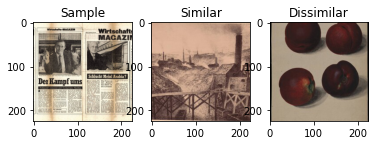

('pz-670_1.224.jpg', 'wwf-110-46-1_1.224.jpg', 'bi-14872-211_1.224.jpg')


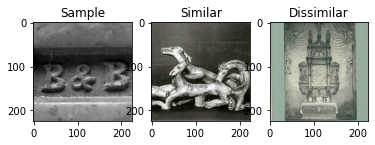

('wwf-91-11-5_1.224.jpg', 'pz-6274_1.224.jpg', 'ki-7406-101_1.224.jpg')


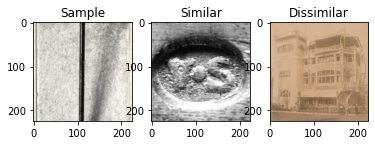

('ki-15765-2460_1.224.jpg', 'ki-8873-225_1.224.jpg', 'ki-12784-24_1.224.jpg')


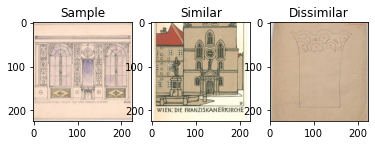

('ki-13832-8_1.224.jpg', 'ki-7419-4_1.224.jpg', 'go-1127-5_1.224.jpg')


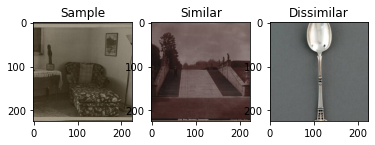

('ki-8777-6_1.224.jpg', 'ki-6396-2-12-9_1.224.jpg', 'pz-1486_1.224.jpg')


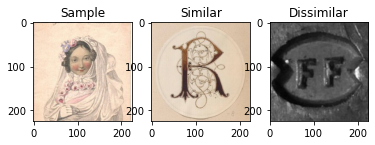

('ki-8773-1_1.224.jpg', 'f-1320_1.224.jpg', 'ki-7565-2_1.224.jpg')


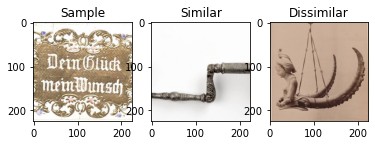

('ei-1380-1_1.224.jpg', 'me-1516_1.224.jpg', 'ki-6997-3_1.224.jpg')


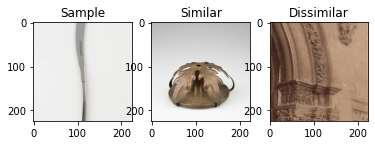

('go-1731_1.224.jpg', 'ki-14142-2-191_1.224.jpg', 'pi-16755_1.224.jpg')


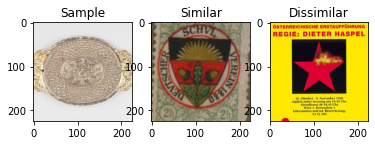

('ki-7493-32_1.224.jpg', 'pi-1600_1.224.jpg', 'h-3195-1_1.224.jpg')


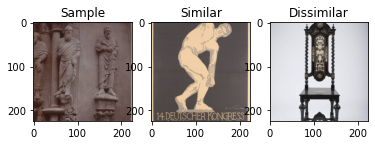

('ki-13904-2_1.224.jpg', 'ki-14145-907-2-145_1.224.jpg', 'ki-5947-14_1.224.jpg')


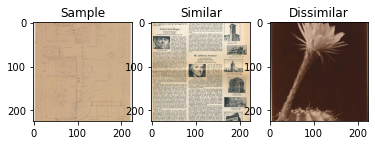

('ki-11743-2_1.224.jpg', 'wws-197_3.224.jpg', 'ki-12039-21_1.224.jpg')


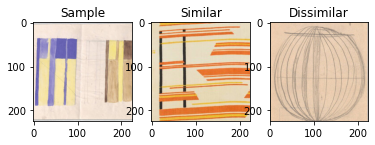

('ki-4615-26_1.224.jpg', 'tgm-22081_1.224.jpg', 't-7390-8-21_1.224.jpg')


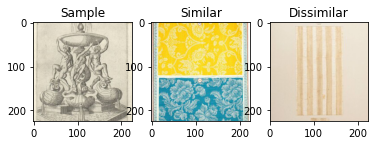

('ki-6396-4-57-1_1.224.jpg', 'ki-6396-2-32-2_1.224.jpg', 'ki-1094-23_1.224.jpg')


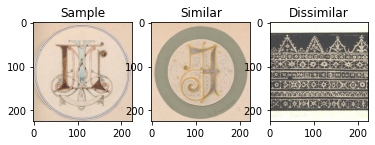

('ki-6285-12_1.224.jpg', 'ki-15556_1.224.jpg', 'ki-19526-7-8_1.224.jpg')


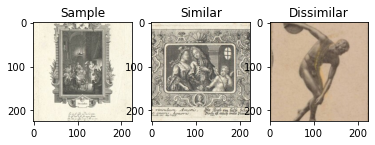

('wwf-116-27-7_1.224.jpg', 'ki-16329-5_1.224.jpg', 'ki-6848-50_1.224.jpg')


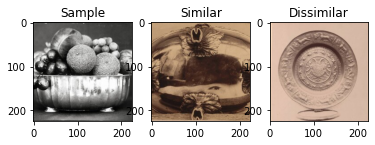

('ki-1-291-1_1.224.jpg', 'ki-2264-6_1.224.jpg', 'ki-15765-932_1.224.jpg')


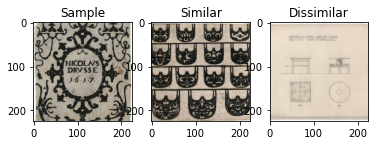

('ki-14274-443-1_1.224.jpg', 't-7390-15-35_1.224.jpg', 'ki-9573-1-2_1.224.jpg')


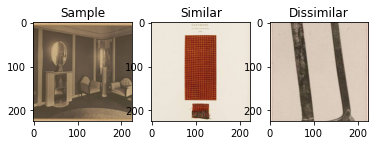

('ki-9471-1-1_1.224.jpg', 'ki-21484-2-114_1.224.jpg', 'bi-14872-1145_1.224.jpg')


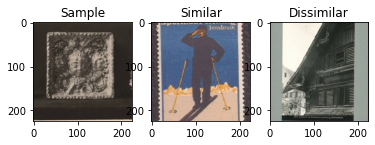

('ki-14145-1055-13_1.224.jpg', 'ki-14291-338_1.224.jpg', 'ki-8677-57-4_1.224.jpg')


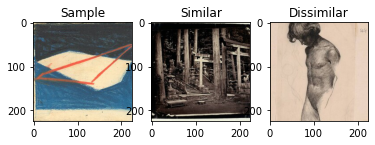

('ki-16112-1_1.224.jpg', 'ki-10020-3_1.224.jpg', 'gl-1091_1.224.jpg')


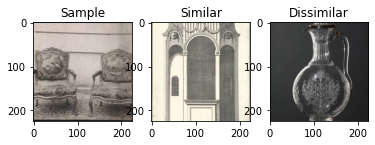

('ki-12119-10_1.224.jpg', 'ki-4434_1.224.jpg', 't-7390-7-5_1.224.jpg')


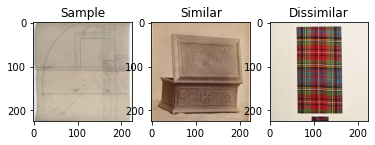

('ki-12716-4_1.224.jpg', 'ki-14274-226-4_1.224.jpg', 'ki-3811-17-1_1.224.jpg')


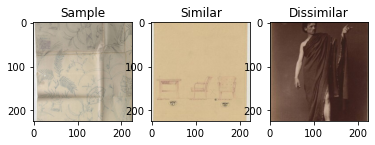

('ki-15765-2244_1.224.jpg', 'ki-7415-98_1.224.jpg', 'ki-6396-3-43-1_1.224.jpg')


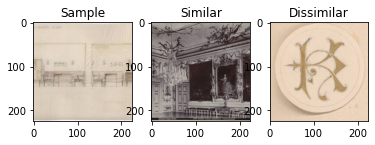

('ki-7647-37_1.224.jpg', 'ki-16092-2_1.224.jpg', 'ki-7412-116_1.224.jpg')


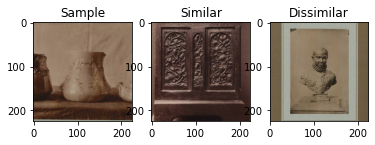

('ki-12696-18_1.224.jpg', 'tgm-22639_1.224.jpg', 'ke-7392-1_1.224.jpg')


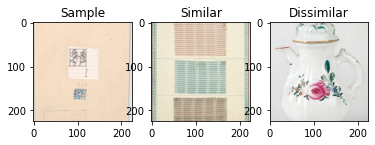

('ki-10174-5_1.224.jpg', 'ki-14607-20_1.224.jpg', 'ki-6396-3-47-2_1.224.jpg')


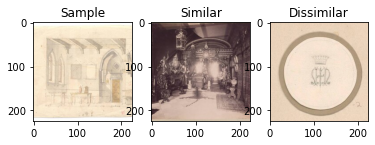

('ki-199-3_1.224.jpg', 'or-3925-443_1.224.jpg', 'ki-16987-3_1.224.jpg')


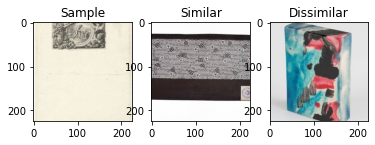

('pi-398_1.224.jpg', 'or-3925-2327_1.224.jpg', 'ki-11935-7_1.224.jpg')


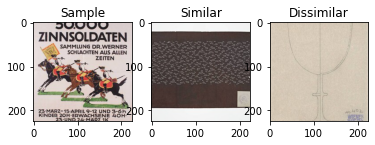

('li-22625_1.224.jpg', 'ki-13131-1_1.224.jpg', 'ki-7088-18_1.224.jpg')


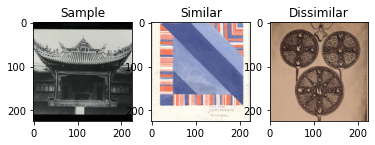

('ki-12441-1_1.224.jpg', 'ki-11144-7_1.224.jpg', 'ki-11325-20_1.224.jpg')


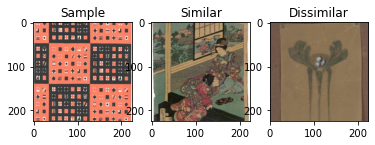

In [22]:
uf.display_triplets(triplets, root_dir, evaluation_dir)

In [23]:
n = 200
triplets_priref = triplet.generate_triplets(image_embedding_priref, "clustering", n, nn_k=1, fn_k=5)#, nr_clusters=8, nr_random_sample=10000)
with open(f'{n}_triplets_priref', 'wb') as fp:
    pickle.dump(triplets, fp)

200 triplets are generated. This may take a while ... 
0 triplets have been removed to preserve uniqueness
200 triplets are returned


In [25]:
for ori,pos,neg in triplets_priref:
    print(ori,pos,neg)
    ori = museum_data[museum_data["priref"]==ori]
    pos = museum_data[museum_data["priref"]==pos]
    neg = museum_data[museum_data["priref"]==neg]
    
    ori.to_html('ori.html')
    pos.to_html('pos.html')
    neg.to_html('neg.html')
    break

221183 146839 65489
